In [1]:
import pandas as pd
import numpy as np
from numpy.random import seed
seed(42)
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
%matplotlib inline

In [2]:
sns.set_theme(context='notebook',style='white', palette='hls')

# General pipeline

Consider this a general guide for using Machine Learning to build predictions or recommendations. For every use case there will be parts that might differ, but you can follow this as an initial approach.

Steps:

1. Understanding the problem, the requirements and the goal
2. Data collection
3. Data cleaning
4. Feature engineering
5. Model training
6. Model evaluation
7. Exporting the results

After evaluating our model, there are more steps like visualization, storytelling, reporting, model deployment, model monitoring, etc. These are not covered in this session.



## 1. Understanding the problem, the requirements and the goal

We have been asked to identify the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data).
The actual forest cover type for a given 30 x 30 meter cell was determined from US Forest Service (USFS) Region 2 Resource Information System data. Independent variables were then derived from data obtained from the US Geological Survey and USFS. The data is in raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type.

This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices.

## 2. Data collection: reading the data and understanding the goal

The training set (15120 observations) contains both features and the Cover_Type. The test set contains only the features. We must predict the Cover_Type for every row in the test set (565892 observations).

With this approach, we will train an algorithm to learn the relationship between the variables (x) and the target variable (`Cover_Type`, y).

In [3]:
df = pd.read_csv('train.csv', index_col='Id')
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Id,,,,,,,,,,,,,,,,,,,,,
1,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
2,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
3,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
4,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
5,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


### Dataset features:
- Elevation - Elevation in meters
- Aspect - Aspect in degrees azimuth
- Slope - Slope in degrees
- Horizontal_Distance_To_Hydrology - Horz Dist to nearest surface water features
- Vertical_Distance_To_Hydrology - Vert Dist to nearest surface water features
- Horizontal_Distance_To_Roadways - Horz Dist to nearest roadway
- Hillshade_9am (0 to 255 index) - Hillshade index at 9am, summer solstice
- Hillshade_Noon (0 to 255 index) - Hillshade index at noon, summer solstice
- Hillshade_3pm (0 to 255 index) - Hillshade index at 3pm, summer solstice
- Horizontal_Distance_To_Fire_Points - Horz Dist to nearest wildfire ignition points
- Wilderness_Area (4 binary columns, 0 = absence or 1 = presence) - Wilderness area designation
    - 1 - Rawah Wilderness Area
    - 2 - Neota Wilderness Area
    - 3 - Comanche Peak Wilderness Area
    - 4 - Cache la Poudre Wilderness Area
- Soil_Type (40 binary columns, 0 = absence or 1 = presence) - Soil Type designation
    - 1 Cathedral family - Rock outcrop complex, extremely stony.
    - 2 Vanet - Ratake families complex, very stony.
    - 3 Haploborolis - Rock outcrop complex, rubbly.
    - 4 Ratake family - Rock outcrop complex, rubbly.
    - 5 Vanet family - Rock outcrop complex complex, rubbly.
    - 6 Vanet - Wetmore families - Rock outcrop complex, stony.
    - 7 Gothic family.
    - 8 Supervisor - Limber families complex.
    - 9 Troutville family, very stony.
    - 10 Bullwark - Catamount families - Rock outcrop complex, rubbly.
    - 11 Bullwark - Catamount families - Rock land complex, rubbly.
    - 12 Legault family - Rock land complex, stony.
    - 13 Catamount family - Rock land - Bullwark family complex, rubbly.
    - 14 Pachic Argiborolis - Aquolis complex.
    - 15 unspecified in the USFS Soil and ELU Survey.
    - 16 Cryaquolis - Cryoborolis complex.
    - 17 Gateview family - Cryaquolis complex.
    - 18 Rogert family, very stony.
    - 19 Typic Cryaquolis - Borohemists complex.
    - 20 Typic Cryaquepts - Typic Cryaquolls complex.
    - 21 Typic Cryaquolls - Leighcan family, till substratum complex.
    - 22 Leighcan family, till substratum, extremely bouldery.
    - 23 Leighcan family, till substratum - Typic Cryaquolls complex.
    - 24 Leighcan family, extremely stony.
    - 25 Leighcan family, warm, extremely stony.
    - 26 Granile - Catamount families complex, very stony.
    - 27 Leighcan family, warm - Rock outcrop complex, extremely stony.
    - 28 Leighcan family - Rock outcrop complex, extremely stony.
    - 29 Como - Legault families complex, extremely stony.
    - 30 Como family - Rock land - Legault family complex, extremely stony.
    - 31 Leighcan - Catamount families complex, extremely stony.
    - 32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.
    - 33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.
    - 34 Cryorthents - Rock land complex, extremely stony.
    - 35 Cryumbrepts - Rock outcrop - Cryaquepts complex.
    - 36 Bross family - Rock land - Cryumbrepts complex, extremely stony.
    - 37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.
    - 38 Leighcan - Moran families - Cryaquolls complex, extremely stony.
    - 39 Moran family - Cryorthents - Leighcan family complex, extremely stony.
    - 40 Moran family - Cryorthents - Rock land complex, extremely stony.

#### To predict:
- Cover_Type (7 types, integers 1 to 7) - Forest Cover Type designation
    - 1 - Spruce/Fir
    - 2 - Lodgepole Pine
    - 3 - Ponderosa Pine
    - 4 - Cottonwood/Willow
    - 5 - Aspen
    - 6 - Douglas-fir
    - 7 - Krummholz

In [4]:
profile = ProfileReport(df, title="Pandas Profiling Report", minimal=False)
profile

Summarize dataset:   0%|          | 0/70 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---

# 2. Data exploration and cleaning - preparing the data and analyzing it.


### First findings
- Correlations
    - No PCA necessary since rather low correlation between features
- Skewness
    - Most of the numerical variables are strongly skewed
- Outliers
    - Based on the visualisation there can no noteworthy outliers be detected
- Irrelevant features:
    - 'Soil_Type7' and 'Soil_Type15' are 0 for all datapoints and can therefore be ignored
    - The Soil types 8, 9?, 25, 28?, 36? occur in ≤10 instances
- Missing values:
    - There are missing values in the dataset
    - zero values in hillshade 3pm
- Other findings:
    - Aspect goes from 0 to 360 indicating a full circle
    - No date values
    - All categorical values have already been encoded -  we will revert this for some further analysis

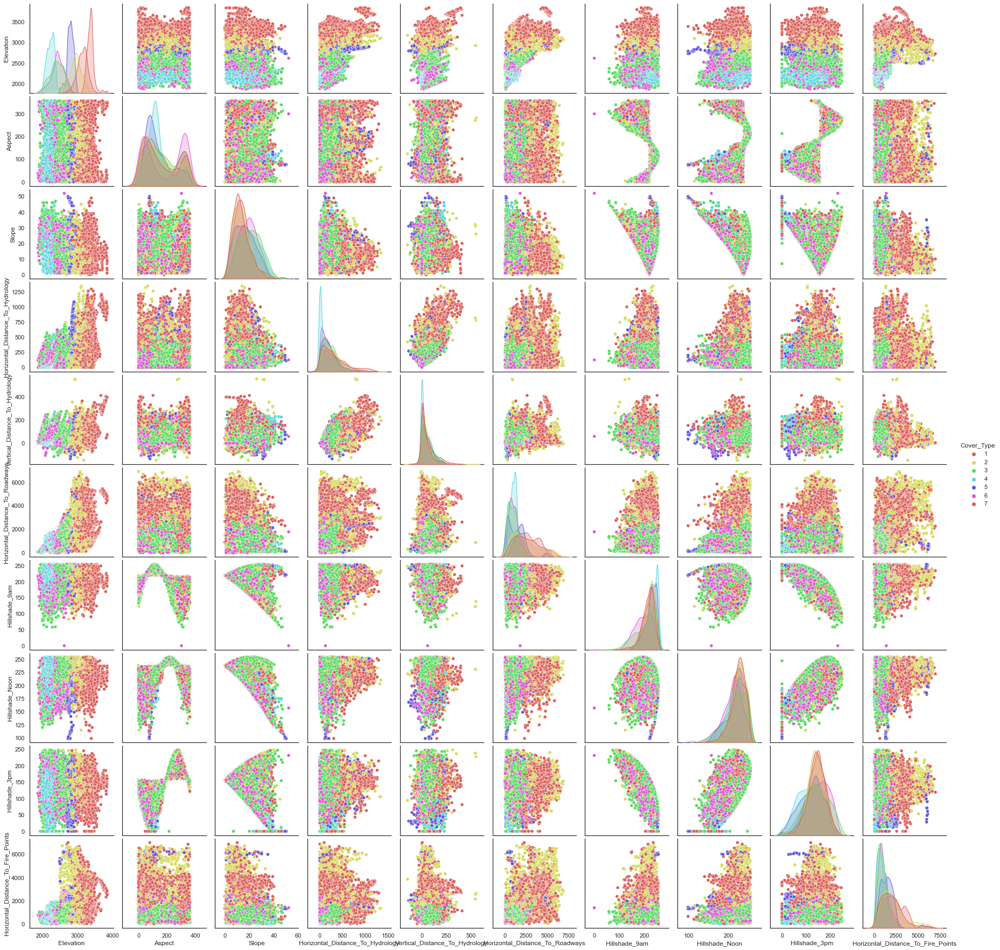

In [5]:
# checking distributions of data - excluding binary data for this step
cols_for_distrib = [
    'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Cover_Type'
]
sns.pairplot(df[cols_for_distrib], hue='Cover_Type', palette='hls');

<AxesSubplot:xlabel='Elevation', ylabel='Density'>

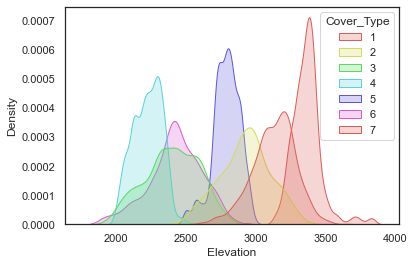

In [6]:
sns.kdeplot(df['Elevation'], hue=df['Cover_Type'], palette='hls', fill=True)

## Findings from pairplot:
- There seems to be a relation between the elevation and the cover type -> expected to be the most important variable

<AxesSubplot:>

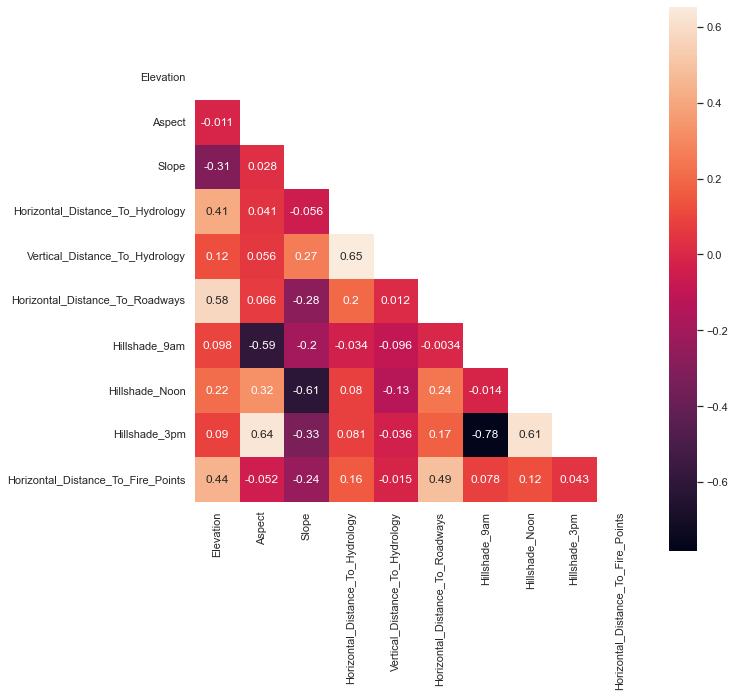

In [7]:
numerical_cols = df.iloc[:,0:10].columns
plt.figure(figsize=(10,10))
mask = np.triu(np.ones_like(df[numerical_cols].corr(), dtype=bool))
sns.heatmap(df[numerical_cols].corr(), mask=mask, square=True, annot=True)

As expected there is correlation between related features (Hillshade_9am, noon and 3pm; Vertical and Horizontal Distance to Hydrology)

Other correlations:
- Elevation and horizontal distance to hydrology: 0.41
- Elevation and horizontal distance to fire points: 0.44

<Figure size 2160x720 with 0 Axes>

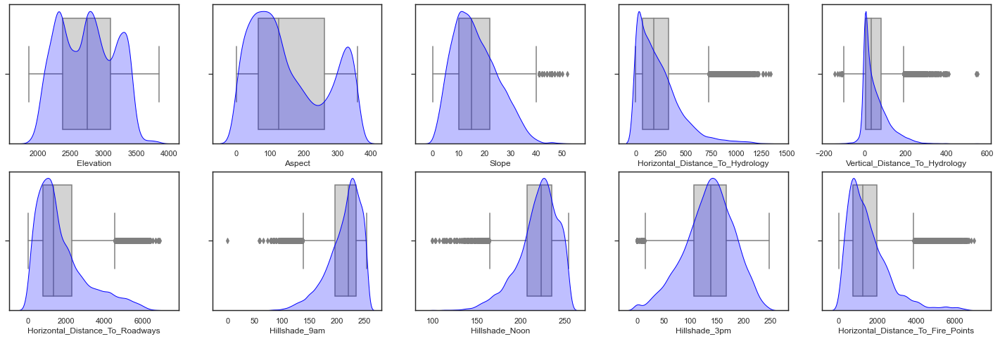

In [8]:
plt.figure(figsize=(30,10))

fig, axes = plt.subplots(2, 5, figsize=(25,8))
for i, feature, ax in zip(range(1,len(numerical_cols)+1),numerical_cols, axes.ravel()):
    ax2 = ax.twinx()
    sns.boxplot(df[feature], color='lightgrey', ax=ax)
    sns.kdeplot(df[feature], color='blue', ax=ax2, fill=True)
    ax2.get_yaxis().set_visible(False)



For further analysis this will be temporarily converted to show the relationship between certain areas and soil types with the Cover Type

In [9]:
Wilderness = pd.DataFrame(df[df.filter(like='Wilderness_Area').columns].idxmax(1))
Wilderness[0] = Wilderness[0].str[-1].astype(int)
Wilderness.columns = ['Wilderness_Area']
Wilderness = Wilderness.join(df['Cover_Type'])

<AxesSubplot:xlabel='Wilderness_Area', ylabel='count'>

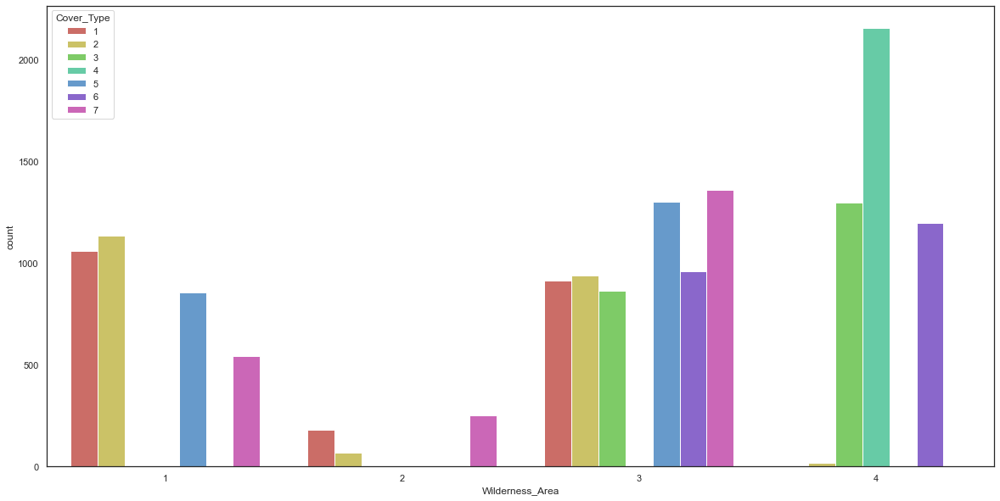

In [10]:
fig,ax = plt.subplots(figsize=(20,10))
sns.countplot(x = 'Wilderness_Area', hue='Cover_Type', data=Wilderness, ax=ax, palette='hls')

In [11]:
Soil = pd.DataFrame(df[df.filter(like='Soil_Type').columns].idxmax(1))
Soil[0] = Soil[0].str.replace('Soil_Type','').astype(int)
Soil.columns = ['Soil_Type']
Soil = Soil.join(df['Cover_Type'])

<AxesSubplot:xlabel='Soil_Type', ylabel='count'>

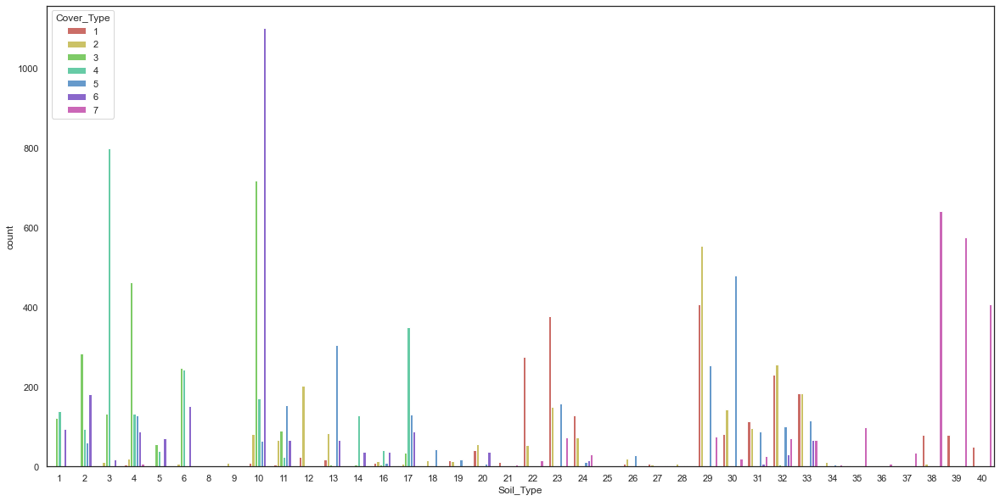

In [12]:
fig,ax = plt.subplots(figsize=(20,10))
#Soil['Soil_Type'].plot(kind='bar', stacked=True)
sns.countplot(x = 'Soil_Type', hue='Cover_Type', data=Soil, ax=ax,  palette='hls')

In [13]:
df.isna().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


---

# 3. Feature engineering

In [14]:
# Main ideas:
# Standardization of certain variables
# Dropping or combining certain variables (e.g. soil types)

In [15]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder, RobustScaler, PowerTransformer, MinMaxScaler
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.impute import KNNImputer, SimpleImputer
import sklearn

In [16]:
sklearn.set_config(display='diagram')

In [17]:
# We drop the following soil types from the df
df = df.drop(['Soil_Type7', 'Soil_Type8', 'Soil_Type15', 'Soil_Type25', 'Soil_Type28'], axis=1)

In [18]:
# Create new feature containing the euclidean distanc to hydrology
df['Distance to Hydrology'] = np.sqrt(np.power(df['Horizontal_Distance_To_Hydrology'], 2) + np.power(df['Vertical_Distance_To_Hydrology'], 2))

In [19]:
# New feature that is the average of all hillshade
df['Average Hillshade'] = (df['Hillshade_9am'] + df['Hillshade_Noon'] + df['Hillshade_3pm'])/3

In [20]:
from sklearn.preprocessing import KBinsDiscretizer

In [21]:
# Add everything up into one function to transform the test set in the same way
def df_cleaning(df):
    
    #Creating new distance features (plus and minus for vertical and same for horizontal)
    df['Elevation_min_VHydro'] = df['Elevation'] - df['Vertical_Distance_To_Hydrology']
    df['Elevation_plus_VHydro'] = df['Elevation'] + df['Vertical_Distance_To_Hydrology']
    df['Hydro_plus_Fire'] = df['Horizontal_Distance_To_Hydrology'] - df['Horizontal_Distance_To_Fire_Points']
    df['Hydro_minus_Fire'] = df['Horizontal_Distance_To_Hydrology'] + df['Horizontal_Distance_To_Fire_Points']
    df['Hydro_plus_Road'] = df['Horizontal_Distance_To_Hydrology'] + df['Horizontal_Distance_To_Roadways']
    df['Hydro_minus_Road'] = df['Horizontal_Distance_To_Hydrology'] - df['Horizontal_Distance_To_Roadways']
    df['Fire_plus_Road'] = df['Horizontal_Distance_To_Fire_Points'] + df['Horizontal_Distance_To_Roadways']
    df['Fire_minus_Road'] = df['Horizontal_Distance_To_Fire_Points'] - df['Horizontal_Distance_To_Roadways']
    
    
    # Create one column containing the respective soil types
    Soil = pd.DataFrame(df[df.filter(like='Soil_Type').columns].idxmax(1))
    df['Soil'] = Soil[0].str.replace('Soil_Type','').astype(int)
    
    # Create one column containing the respective wilderness areas
    Wilderness = pd.DataFrame(df[df.filter(like='Wilderness_Area').columns].idxmax(1))
    df['Wilderness'] = Wilderness[0].str[-1].astype(int)
    
    # Create new features for average hillshade and the euclidean distance to hydrology
    df['Average Hillshade'] = (df['Hillshade_9am'] + df['Hillshade_Noon'] + df['Hillshade_3pm'])/3
    df['Distance to Hydrology'] = np.sqrt(np.power(df['Horizontal_Distance_To_Hydrology'], 2) + np.power(df['Vertical_Distance_To_Hydrology'], 2))
    
    #Create a list of Soil and Wilderness columns to drop later
    soil_cols = df.filter(like='Soil_Type').columns
    area_cols = df.filter(like='Wilderness_Area').columns
    
    #Drop the soil and wilderness columns
    df = df.drop(columns=soil_cols, axis=1)
    df = df.drop(columns=area_cols, axis=1)
    
    #We tried the sin of aspect but it did not improve our model
    #df['Aspect_sin'] = np.sin(df['Aspect'])
    
    #We tried to replace the zero values in the hillshade 3pm column with the median but it did not have any effect
    #on the accuracy - since there might be some value in zero values for the test data we will keep these in our model
    df['Hillshade_3pm'] = df['Hillshade_3pm'].replace(0,df['Hillshade_3pm'].median())
    
    return df

In [22]:
# Reset OneHotEncoder for the soil type and wilderness
Soil = pd.DataFrame(df[df.filter(like='Soil_Type').columns].idxmax(1))
df['Soil'] = Soil[0].str.replace('Soil_Type','').astype(int)

Wilderness = pd.DataFrame(df[df.filter(like='Wilderness_Area').columns].idxmax(1))
df['Wilderness'] = Wilderness[0].str[-1].astype(int)


In [23]:
# Create two column transformers

ct_scale  = make_column_transformer(
    (RobustScaler(), make_column_selector(dtype_include='number')),
    (OneHotEncoder(), ['Soil', 'Wilderness']),
    
)
ct_NB = make_column_transformer(
    (MinMaxScaler(), make_column_selector(dtype_include='number')),
    (OneHotEncoder(), ['Soil', 'Wilderness']),
)

---

# 4. Model Selection

## Possible Algos
- random forest
- XGBoost
- logistic regression
    - It assumes that there is minimal or no multicollinearity among the independent variables.
    - It usually requires a large sample size to predict properly.
    - It assumes the observations to be independent of each other.
- SVM
    - It assumes data is independent and identically distributed.
- LDA
    - For numerical data
- KNN
    - The data is in feature space, which means data in feature space can be measured by distance metrics such as Manhattan, Euclidean, etc.
    - Each of the training data points consists of a set of vectors and a class label associated with each vector.
    - Desired to have ‘K’ as an odd number in case of 2 class classification.

In [24]:
from sklearn.tree import DecisionTreeClassifier

In [25]:
from sklearn.model_selection import cross_val_score

In [26]:
# We apply the cleaning function and assign to a new dataframe.
df_clean = df_cleaning(df)

# We define the soil and wilderness columns as type category
for column in ['Soil', 'Wilderness']:
    df_clean[column] = df_clean[column].astype('category')

In [27]:
# Create ou X and y
X_tree = df_clean.drop(columns='Cover_Type')
y = df_clean['Cover_Type']

In [28]:
# Checking the dtypes of all columns
df_clean.dtypes

Elevation                                int64
Aspect                                   int64
Slope                                    int64
Horizontal_Distance_To_Hydrology         int64
Vertical_Distance_To_Hydrology           int64
Horizontal_Distance_To_Roadways          int64
Hillshade_9am                            int64
Hillshade_Noon                           int64
Hillshade_3pm                            int64
Horizontal_Distance_To_Fire_Points       int64
Cover_Type                               int64
Distance to Hydrology                  float64
Average Hillshade                      float64
Soil                                  category
Wilderness                            category
Elevation_min_VHydro                     int64
Elevation_plus_VHydro                    int64
Hydro_plus_Fire                          int64
Hydro_minus_Fire                         int64
Hydro_plus_Road                          int64
Hydro_minus_Road                         int64
Fire_plus_Roa

In [29]:
#X_scale is a df that has been rescaled using Robust Scaler
X_scale = ct_scale.fit_transform(df_clean.drop(columns='Cover_Type'))

#X_NB is a df that has been rescaled using MinMax Scaler
X_NB = ct_NB.fit_transform(df_clean.drop(columns='Cover_Type'))

In [30]:
#Logistic regression (X_scale has been used)
from sklearn.linear_model import LogisticRegression
cover_lr = LogisticRegression(random_state=42,solver='liblinear')
result_lr = np.mean(cross_val_score(cover_lr, X_scale, y))
print("Accuracy = {0:.4f}".format(result_lr))

Accuracy = 0.6185


In [31]:
#Simple decision tree (X_tree has been used)
cover_tree  = DecisionTreeClassifier(random_state=42)
result_dt = np.mean(cross_val_score(cover_tree, X_tree, y))
print("Accuracy = {0:.4f}".format(result_dt))

Accuracy = 0.7249


In [32]:
from sklearn.ensemble import RandomForestClassifier

In [33]:
#Random Forest using the maximum number of features
cover_bagging = RandomForestClassifier(random_state=42, max_features=X_tree.shape[1])
result_bag = np.mean(cross_val_score(cover_bagging, X_tree, y))
print("Accuracy = {0:.4f}".format(result_bag))

Accuracy = 0.7890


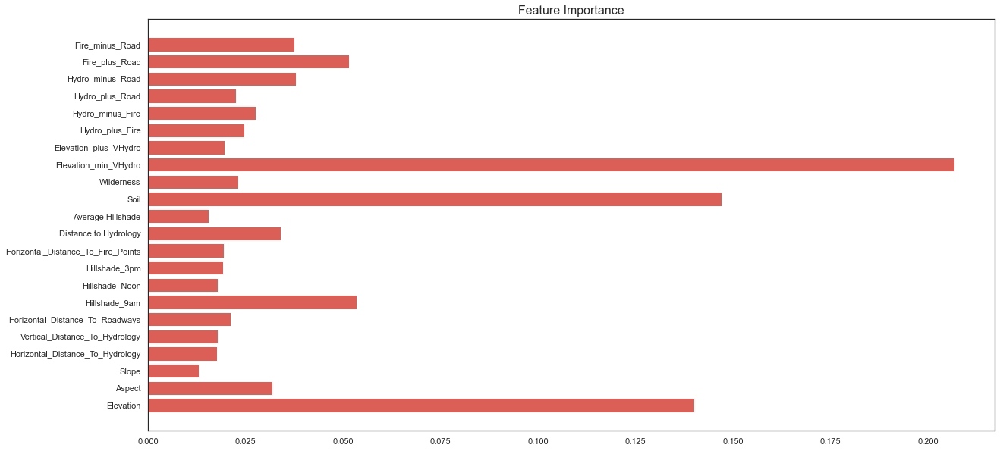

In [34]:
# We can plot the feature importance of Random Forest model
plt.figure(figsize=(20,10))
cover_bagging.fit(X_tree,y)
plt.barh(X_tree.columns, cover_bagging.feature_importances_)
plt.title('Feature Importance', fontsize=16);

In [35]:
#Random Forest without specifying the maximum number of features.
#Better performance
cover_rf = RandomForestClassifier(random_state=42)
result_rf = np.mean(cross_val_score(cover_rf, X_tree, y))
print("Accuracy = {0:.4f}".format(result_rf))

Accuracy = 0.8079


In [36]:
from sklearn.ensemble import ExtraTreesClassifier

In [37]:
#Extra Trees
cover_extra = ExtraTreesClassifier(random_state=42)
result_extra = np.mean(cross_val_score(cover_extra, X_tree, y))
print("Accuracy = {0:.4f}".format(result_extra))

Accuracy = 0.8221


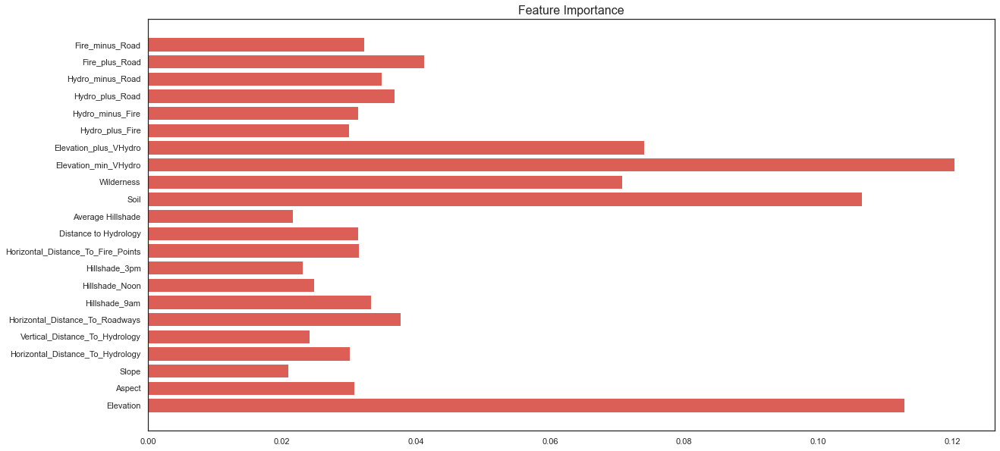

In [38]:
# We can plot the feature importance of Extra Trees model
plt.figure(figsize=(20,10))
cover_extra.fit(X_tree,y)
plt.barh(X_tree.columns, cover_extra.feature_importances_)
plt.title('Feature Importance', fontsize=16);

In [39]:
from xgboost.sklearn import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
from scipy.stats import randint, uniform

In [40]:
#XGBoost does not allow dtype category so for this we revert the changes to the categroical columns
X_xgb = X_tree
for column in ['Soil', 'Wilderness']:
    X_xgb[column] = X_xgb[column].astype(int)

In [41]:
#XGBoost
cover_xg = XGBClassifier(random_state=42, verbosity=0)
result_xgb = np.mean(cross_val_score(cover_xg, X_xgb, y, scoring='accuracy'))
print("Accuracy = {0:.4f}".format(result_xgb))

Accuracy = 0.7998


---

#### PCA & LDA

In [42]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
pca = PCA()
X_pca_test = pca.fit(X_scale)
lda = LinearDiscriminantAnalysis()

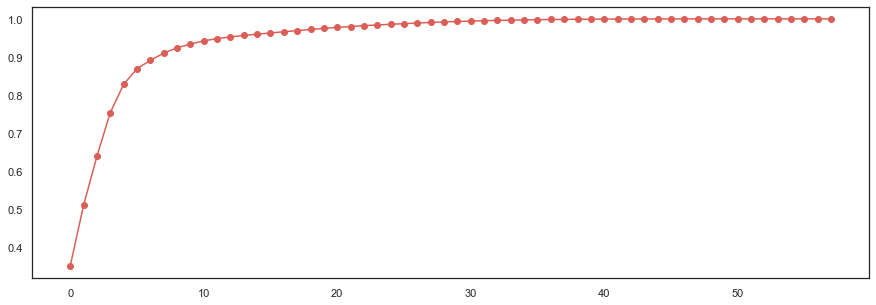

In [43]:
#Even though we said that PCA is not usefull in our situation, we wanted to try it and see the effect.
#Plot the cummulative variance of components (PCA).

variance_exp = X_pca_test.explained_variance_ratio_
cummulative = []
for i in range(len(variance_exp)):
    cummulative.append(sum(variance_exp[0:i]))
plt.figure(figsize=(15,5))
plt.plot(cummulative[1:], marker='o')

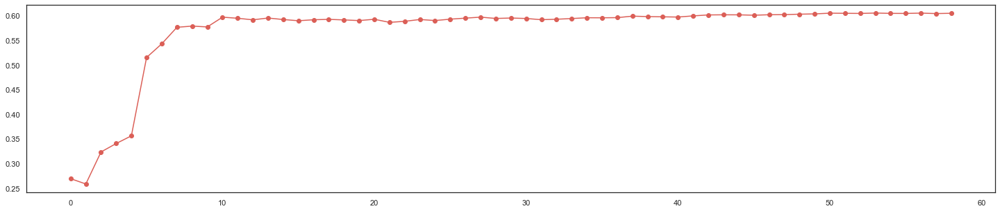

In [44]:
#Plotting the LDA accuracy depending the number of components.
#Accuracy is quite low

scores = []
for n in range(1, len(variance_exp)+1):
    pca = PCA(n_components=n)
    lda = LinearDiscriminantAnalysis()
    X_pca = pca.fit_transform(X_scale)
    scores.append(np.mean(cross_val_score(lda, X_pca, y, scoring='accuracy')))
    
fig, ax = plt.subplots(figsize=(25,5))
ax.plot(scores, marker='o')

In [45]:
#LDA with PCA

pca = PCA(n_components=11)
X_pca = pca.fit_transform(X_scale)
lda = LinearDiscriminantAnalysis()
result_ldap = np.mean(cross_val_score(lda, X_pca, y, scoring='accuracy'))
print("LDA with PCA Accuracy = {0:.4f}".format(result_ldap))

LDA with PCA Accuracy = 0.5970


In [46]:
#LDA without PCA

lda = LinearDiscriminantAnalysis()
result_lda = np.mean(cross_val_score(lda, X_scale, y, scoring='accuracy'))
print("LDA Accuracy = {0:.4f}".format(result_lda))

LDA Accuracy = 0.6030


---

#### SVM

In [47]:
from sklearn import svm

svm_clf = svm.SVC(C=1,kernel='rbf')
result_svm = np.mean(cross_val_score(svm_clf, X_scale, y, scoring='accuracy'))
print("Accuracy = {0:.4f}".format(result_svm))

Accuracy = 0.7057


---

#### KNN

In [48]:
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier(n_neighbors=7)
result_KNN = np.mean(cross_val_score(KNN, X_scale, y, scoring='accuracy'))
print("Accuracy = {0:.4f}".format(result_KNN))

Accuracy = 0.6934


#### Naive Bayes

In [49]:
from sklearn.naive_bayes import MultinomialNB

naive_bayes_clf = MultinomialNB()
result_nb = np.mean(cross_val_score(naive_bayes_clf, X_NB, y, scoring='accuracy'))
print("Naive Bayes Accuracy = {0:.4f}".format(result_nb))

Naive Bayes Accuracy = 0.5694


---

# Model selection

In [50]:
accuracy_scores = pd.DataFrame(columns = ['Model', 'baseline_mean_CV_score'])
accuracy_scores.loc[0, :] = ['Logistic regression', result_lr]
accuracy_scores.loc[1, :] = ['Decision tree', result_dt]
accuracy_scores.loc[2, :] = ['Random forest', result_rf]
accuracy_scores.loc[3, :] = ['Decision Tree (Bag)', result_bag]
accuracy_scores.loc[4, :] = ['Xgboost', result_xgb]
accuracy_scores.loc[5, :] = ['SVM', result_svm]
accuracy_scores.loc[6, :] = ['KNN', result_KNN]
accuracy_scores.loc[7, :] = ['LDA with PCA', result_ldap]
accuracy_scores.loc[8, :] = ['LDA', result_lda]
accuracy_scores.loc[9, :] = ['Naive Bayes', result_nb]
accuracy_scores.loc[10, :] = ['Extra Trees', result_extra]

accuracy_scores = accuracy_scores.sort_values('baseline_mean_CV_score', ascending = True).set_index('Model')

Text(0.5, 1.0, 'Scores before tuning')

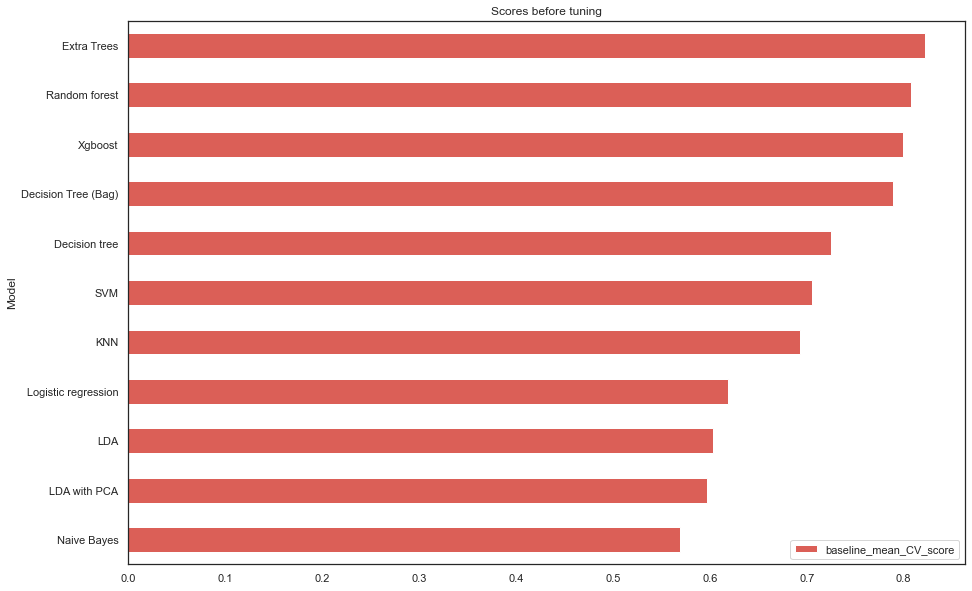

In [51]:
#We plot the accuracy of all the models we tried

fig, ax = plt.subplots(figsize=(15,10))
accuracy_scores.plot(kind='barh', ax=ax)
ax.set_title('Scores before tuning')

For the next steps we will only use the two best models (ExtraTrees and RandomForest) to tune the hyperparameters

---

# Tuning & Training

In [52]:
# Only need X_tree for the rest of the notebook
X = X_tree

In [53]:
from sklearn.model_selection import GridSearchCV

In [54]:
# Final steps of grid search (previous runs have been updated with the best values to narrow down the optimal tuning)
param_grid_rf = [{
    'n_estimators':[122, 125, 130],
    'max_depth': [35, 37],
    'max_features':[0.14, 0.15, 0.17],
    'min_samples_leaf':[1]
}]

In [55]:
cover_rf_tuned = RandomForestClassifier(random_state=42)
gs_rf = GridSearchCV(cover_rf_tuned, param_grid = param_grid_rf, n_jobs=-1)

In [56]:
gs_rf.fit(X, y)

GridSearchCV(estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid=[{'max_depth': [35, 37],
                          'max_features': [0.14, 0.15, 0.17],
                          'min_samples_leaf': [1],
                          'n_estimators': [122, 125, 130]}])

In [57]:
#This is the best score we obtain after running our GS on Random Forest
gs_rf.best_score_

0.8077380952380953

In [58]:
#This is the best parameters we obtain after running our GS on Random Forest
gs_rf.best_params_

{'max_depth': 37,
 'max_features': 0.14,
 'min_samples_leaf': 1,
 'n_estimators': 130}

In [59]:
cover_rf_tuned_final = RandomForestClassifier(random_state=42, max_depth=37, max_features=0.14, n_estimators=130)
cover_rf_tuned_final

RandomForestClassifier(max_depth=37, max_features=0.14, n_estimators=130,
                       random_state=42)

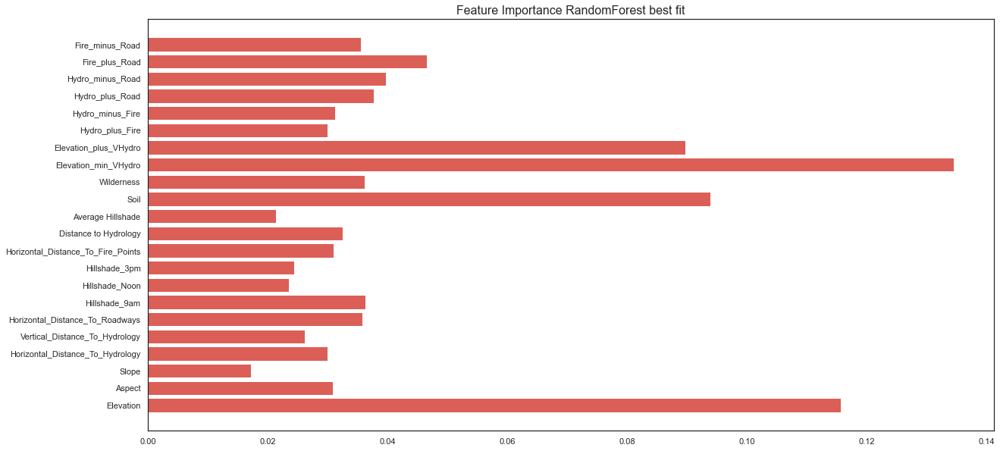

In [60]:
# We can plot the feature importance of Random Forest

plt.figure(figsize=(20,10))
cover_rf_tuned_final.fit(X,y)
plt.barh(X_tree.columns, cover_rf_tuned_final .feature_importances_)
plt.title('Feature Importance RandomForest best fit', fontsize=16);

In [61]:
# Final steps of grid search (previous runs have been updated with the best values to narrow down the optimal tuning)
param_grid_extra = [{
    'n_estimators':[315, 335],
    'max_depth': [10,30],
    'max_features':[0.34, 0.35, 0.36],
    'min_samples_leaf':[1,3]
}]

In [62]:
cover_extra = ExtraTreesClassifier(random_state=42)
gs_extra = GridSearchCV(cover_extra, param_grid = param_grid_extra, n_jobs=-1)

In [63]:
gs_extra.fit(X, y)

GridSearchCV(estimator=ExtraTreesClassifier(random_state=42), n_jobs=-1,
             param_grid=[{'max_depth': [10, 30],
                          'max_features': [0.34, 0.35, 0.36],
                          'min_samples_leaf': [1, 3],
                          'n_estimators': [315, 335]}])

In [64]:
#This is the best score we obtain after running our GS on Extra Trees

gs_extra.best_score_

0.8257275132275133

In [65]:
#This is the best parameters we obtain after running our GS on Extra Trees

gs_extra.best_params_

{'max_depth': 30,
 'max_features': 0.34,
 'min_samples_leaf': 1,
 'n_estimators': 335}

In [66]:
cover_final = ExtraTreesClassifier(random_state=42, max_depth=30, n_estimators=335, min_samples_leaf=1, max_features=0.34)
result_cover_final = np.mean(cross_val_score(cover_final, X, y, scoring='accuracy'))
print("Accuracy = {0:.4f}".format(result_cover_final))

Accuracy = 0.8257


In [67]:
ExtraTreesClassifier(random_state=42, max_depth=30, n_estimators=335, min_samples_leaf=1, max_features=0.34)

ExtraTreesClassifier(max_depth=30, max_features=0.34, n_estimators=335,
                     random_state=42)

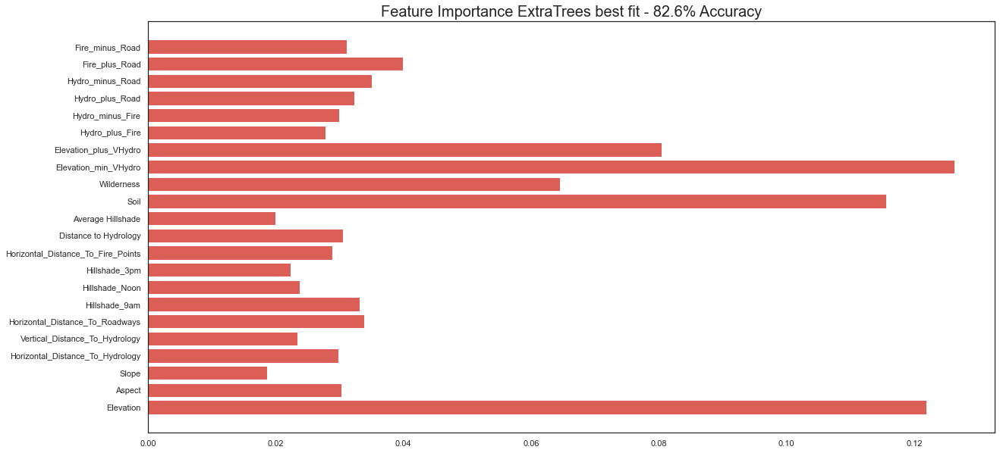

In [68]:
# We can plot the feature importance of Extra Trees final model

plt.figure(figsize=(20,10))
cover_final.fit(X,y)
plt.barh(X_tree.columns, cover_final.feature_importances_)
plt.title('Feature Importance ExtraTrees best fit - 82.6% Accuracy', fontsize=20)
plt.rc('ytick', labelsize=15)

---

As the CV accuracy is greater for Extra Trees, we will go with this model to predict on our test set.

In [69]:
#We read the test set and clean apply the df_cleaning function that creates new variables.

df_test = pd.read_csv('test.csv', index_col='Id')
X_test = df_cleaning(df_test)

In [70]:
X_test.shape

(565892, 22)

In [71]:
X_test.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Hydro_plus_Fire,Hydro_minus_Fire,Hydro_plus_Road,Hydro_minus_Road,Fire_plus_Road,Fire_minus_Road,Soil,Wilderness,Average Hillshade,Distance to Hydrology
Id,,,,,,,,,,,,,,,,,,,,,
15121,2680,354,14,0,0,2684,196,214,156,6645,...,-6645,6645,2684,-2684,9329,3961,29,1,188.666667,0.0
15122,2683,0,13,0,0,2654,201,216,152,6675,...,-6675,6675,2654,-2654,9329,4021,29,1,189.666667,0.0
15123,2713,16,15,0,0,2980,206,208,137,6344,...,-6344,6344,2980,-2980,9324,3364,29,1,183.666667,0.0
15124,2709,24,17,0,0,2950,208,201,125,6374,...,-6374,6374,2950,-2950,9324,3424,29,1,178.000000,0.0
15125,2706,29,19,0,0,2920,210,195,115,6404,...,-6404,6404,2920,-2920,9324,3484,29,1,173.333333,0.0


In [72]:
#We sort the column of X_test assending

X_test = X_test.reindex(sorted(X_test.columns), axis=1)
X_test.columns

Index(['Aspect', 'Average Hillshade', 'Distance to Hydrology', 'Elevation',
       'Elevation_min_VHydro', 'Elevation_plus_VHydro', 'Fire_minus_Road',
       'Fire_plus_Road', 'Hillshade_3pm', 'Hillshade_9am', 'Hillshade_Noon',
       'Horizontal_Distance_To_Fire_Points',
       'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hydro_minus_Fire', 'Hydro_minus_Road', 'Hydro_plus_Fire',
       'Hydro_plus_Road', 'Slope', 'Soil', 'Vertical_Distance_To_Hydrology',
       'Wilderness'],
      dtype='object')

In [73]:
#We sort the column of X assending

X = X.reindex(sorted(X.columns), axis=1)
X.columns

Index(['Aspect', 'Average Hillshade', 'Distance to Hydrology', 'Elevation',
       'Elevation_min_VHydro', 'Elevation_plus_VHydro', 'Fire_minus_Road',
       'Fire_plus_Road', 'Hillshade_3pm', 'Hillshade_9am', 'Hillshade_Noon',
       'Horizontal_Distance_To_Fire_Points',
       'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hydro_minus_Fire', 'Hydro_minus_Road', 'Hydro_plus_Fire',
       'Hydro_plus_Road', 'Slope', 'Soil', 'Vertical_Distance_To_Hydrology',
       'Wilderness'],
      dtype='object')

In [74]:
#We predict the X_test with the model

cover_final.fit(X, y)
y_pred = cover_final.predict(X_test)

In [75]:
#Prepare the submission file with prediction per Id

submission = pd.DataFrame(df_test.reset_index()['Id']).join(pd.DataFrame(y_pred))
submission.columns=['Id', 'Cover_Type']
submission.head()

,Id,Cover_Type
0,15121,1
1,15122,1
2,15123,1
3,15124,1
4,15125,1


In [76]:
#Save as CSV to export on Kaggle

submission.to_csv('GROUP_C_SUBMISSION.csv', index=False)